<a href="https://colab.research.google.com/github/shawntharoo/GoogleColabProjects/blob/main/Copy_of_MBA509_A3_Named_Entity_Recognition_AND_Video_Action_Detection_Using_CNNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 142345_Kaluthara Koralalage Sandakelum Tharindu Adikaram_ner_video
# MBA509 A3  Named Entity Recognition & Video Action Detection using CNNs

This notebook explores:
* how NLP (SpaCy) are applied to gain insights from documents (unstructured data).

The material also includes a section on how to construct our own AI  using Tensorflow & Keras APIs



# Natural Language Processing

We will use SpaCy: https://spacy.io/

Primary Tasks:
* Document Insights: structures, words, similarities, polarities
* Named Entity Recognition
* Sentiment Analysis

In [ ]:
# this is the workaround for GPU error cuDNN
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 43 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed.
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  libcudnn8 8.1.0.77-1+cuda11.2 [430 MB]
Fetched 430 MB in 7s (61.7 MB/s)
(Reading database ... 155632 files and directories currently installed.)
Removing libcudnn8-dev (8.0.5.39-1+cuda11.1) ...
(Reading database ... 155610 files and directories currently installed.)
Preparing to unpack .../libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+c

# INSTALLATIONS

In [ ]:
!pip install spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!python -m spacy download en_core_web_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.0 MB 32.6 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [ ]:
import spacy
from spacy import displacy
from IPython.core.display import display, HTML
from spacy.tokens import Span
from spacy.symbols import ORTH
from spacy.lang.en import English

# SpaCy NLP Process

"This will return a Language object containing all components and data needed to process text. We usually call it nlp. Calling the nlp object on a string of text will return a processed Doc:"

# The Editorial Data for L'Interdit (translate: The Forbidden) Fragrance

# This is an example fragrance Editorial

Coco Mademoiselle L'Eau Privée by Chanel is a Amber Floral fragrance for women. This is a new fragrance. Coco Mademoiselle L'Eau Privée was launched in 2020. The nose behind this fragrance is Olivier Polge. Top note is Mandarin Orange; middle notes are Rose and Jasmine; base note is White Musk.

Coco Mademoiselle L'Eau Privée is the latest interpretation of the modern classic perfume from the house of Chanel - Coco Mademoiselle, available for purchase from mid-August 2020. This novelty represents the idea of a "night scent", and a refined and private way of wearing a perfume.

Coco Mademoiselle L'Eau Privée is a light oriental made especially for the night - and not for night outs, but for wearing it in bed. Composed of rose, jasmine and musky notes, it is made to be applied to the skin and neglected as an elegant ritual and gesture before bed. The composition is signed by Chanel in-house perfumer Olivier Polge.

The bottle retains the shape of the original, this time available in frosted glass. Chanel Coco Mademoiselle L'Eau Privée comes in 50 and 100 ml Eau de Parfum.

# The Grammatical Structure

*  How are the words related?

"For example, if you’re analyzing text, it makes a huge difference whether a noun is the subject of a sentence, or the object – or whether “google” is used as a verb, or refers to the website or company in a specific context."

In [ ]:
nlp = spacy.load("en_core_web_sm")
doc = nlp("Coco Mademoiselle L'Eau Privée by Chanel is a Amber Floral fragrance for women.")
displacy.render(doc, style="dep")

'<svg xmlns="http://www.w3.org/2000/svg" xmlns:xlink="http://www.w3.org/1999/xlink" xml:lang="en" id="887b2dbb55564adea07e051df0640183-0" class="displacy" width="2325" height="487.0" direction="ltr" style="max-width: none; height: 487.0px; color: #000000; background: #ffffff; font-family: Arial; direction: ltr">\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="397.0">\n    <tspan class="displacy-word" fill="currentColor" x="50">Coco</tspan>\n    <tspan class="displacy-tag" dy="2em" fill="currentColor" x="50">PROPN</tspan>\n</text>\n\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="397.0">\n    <tspan class="displacy-word" fill="currentColor" x="225">Mademoiselle</tspan>\n    <tspan class="displacy-tag" dy="2em" fill="currentColor" x="225">PROPN</tspan>\n</text>\n\n<text class="displacy-token" fill="currentColor" text-anchor="middle" y="397.0">\n    <tspan class="displacy-word" fill="currentColor" x="400">L\'Eau</tspan>\n    <tspan class

In [ ]:
nlp = spacy.load("en_core_web_sm")
doc = nlp("Black Opium Eau de Parfum is a modern glam rock version of a classic feminine scent.")
displacy.render(doc, style="dep", jupyter=True,  options={'distance': 90})

In [ ]:
nlp = spacy.load("en_core_web_sm")
text = "Coco Mademoiselle L'Eau Privée is a light oriental made especially for the night - and not for night outs, but for wearing it in bed. Composed of rose, jasmine and musky notes, it is made to be applied to the skin and neglected as an elegant ritual and gesture before bed. The composition is signed by Chanel in-house perfumer Olivier Polge."
doc = nlp(text)
sentence_spans = list(doc.sents)
displacy.render(sentence_spans, style="dep", jupyter=True,  options={'distance': 120})

# SpaCy Named Entities

"A named entity is a “real-world object” that’s assigned a name – for example, a person, a country, a product or a book title. spaCy can recognize various types of named entities in a document, by asking the model for a prediction. Because models are statistical and strongly depend on the examples they were trained on, this doesn’t always work perfectly and might need some tuning later, depending on your use case."




In [ ]:
text = "Black Opium Eau de Parfum is a modern glam rock version of a classic feminine scent. Designed like a shot of adrenalin, this fragrance will stop them intensely in their tracks.  Assertive and unique, the Black Opium woman embodies the new Yves Saint Laurent spirit. Free and self-confident, she expresses a femininity glamourous yet impertinent. Always searching for new experiences, nothing will stop her. The Black Opium Eau de Parfum bottle is reinvented in an unconditionally rock decor. The black glitter finish electrifies the intense black lacquer and reveals a blazing ring of burning femininity.Black Opium Extreme by Yves Saint Laurent is a Amber Vanilla fragrance for women. This is a new fragrance. Black Opium Extreme was launched in 2021. Top notes are Coffee and Cacao; middle notes are Jasmine Sambac and Orange Blossom; base notes are Bourbon Vanilla and Patchouli."

nlp = spacy.load("en_core_web_sm")
doc = nlp(text)

# Named entities are available as the ents property of a Doc
displacy.render(doc, style="ent", jupyter=True)

In [ ]:
nlp = spacy.load("en_core_web_sm")
doc = nlp("Black Opium Eau de Parfum is a modern glam rock version of a classic feminine scent. Designed like a shot of adrenalin, this fragrance will stop them intensely in their tracks.  Assertive and unique, the Black Opium woman embodies the new Yves Saint Laurent spirit. Free and self-confident, she expresses a femininity glamourous yet impertinent. Always searching for new experiences, nothing will stop her. The Black Opium Eau de Parfum bottle is reinvented in an unconditionally rock decor. The black glitter finish electrifies the intense black lacquer and reveals a blazing ring of burning femininity.")

for ent in doc.ents:
    print(ent.text, ent.start_char, ent.end_char, ent.label_)
    
    
displacy.render(doc, style="ent", jupyter=True,  options={'distance': 70})    

Black Opium Eau de Parfum 0 25 ORG
adrenalin 109 118 GPE
Black Opium 204 215 ORG
Yves Saint Laurent 239 257 FAC
The Black Opium Eau de Parfum 407 436 ORG


# Examining the User Reviews for Insights

# SpaCy Sentiment Analysis

# User Reviews Data

If you want to smell like bubblegum with a hint of woods in a good way get this one. I adore this one.

I received a sample of this from Sephora and I suppose I like it. I'm getting grape soda and licorice vibes with hints of white floral (tuberose and jasmine). Would I buy a full bottle? Maybe. We'll see how the dry down develops.
*Edit* I'm reporting back that it did not change. Just grape and licorice. It's fun, but I don't think I'd go for a full size.

I really like it! I also think it smells like a grape candy and somewhat similar to the only one 2.

I adore this perfume. It's fresh, sophisticated, feminine, oozes confidence. I don't notice any sweetness to it, for me it smells mainly white flowers with a slightly darker twist. I find it can be worn in any season and part of the day.

A beautiful fragrance and a clear Dominique touch with it
The opening notes are tuberose, orange blossom and white blossom
And the performance evolves as a stabilized rod to a wooden performance, vetiver mixed with vanilla
The same style that we see with Hypnotic Poison
Perfume suitable for winter and autumn times, day and night, gives a smoky impression, like incense or cigarettes, but with a feminine touch 😊.

both floral and sweet. it's not the most unique perfume but still amazing.


In [ ]:
from textblob import TextBlob
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('brown')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!


True

In [ ]:
review = TextBlob("Upon first application it has a pleasant sweet vanilla smell with just a touch of light floral scent like honeysuckle or jasmine. Right after you spray it, it does smell a little trashy and boozy, in that the alcohol scent is still there. I don’t really get any of the coffee or darker scents until a few hours later when it really starts mixing with the chemistry of my skin. The final scent is a sweet vanilla late with a hint of musk and spice. This is definitely a perfume that needs to age on the skin a little bit, so don’t judge it until it’s had ample time to mingle with your oils. I will say, the coffee scent is way more subtle than I thought it was going to be and so is the more masculine musky smell that some people have been talking about. Nevertheless, I think this is a safe buy for most people who like gourmands. I love it! My boyfriend loves it too ;) Haven’t worn it out in public yet but I’m sure when I do I’ll probably get complimented on it like a lot of other people have been mentioning. Also I think the longevity and potency is perfect for my purposes. I only do a tiny, tiny spritz on my wrists, a tiny spritz on my neck, and finally I spritz and walk through the mist. You don’t need much. Theres nothing worse in my opinion than a perfume that smacks everybody in the face when they walk into a room. Don’t overdo it.")

In [ ]:
review.tags

[('Upon', 'IN'),
 ('first', 'JJ'),
 ('application', 'NN'),
 ('it', 'PRP'),
 ('has', 'VBZ'),
 ('a', 'DT'),
 ('pleasant', 'JJ'),
 ('sweet', 'JJ'),
 ('vanilla', 'NN'),
 ('smell', 'NN'),
 ('with', 'IN'),
 ('just', 'RB'),
 ('a', 'DT'),
 ('touch', 'NN'),
 ('of', 'IN'),
 ('light', 'JJ'),
 ('floral', 'JJ'),
 ('scent', 'NN'),
 ('like', 'IN'),
 ('honeysuckle', 'NN'),
 ('or', 'CC'),
 ('jasmine', 'NN'),
 ('Right', 'RB'),
 ('after', 'IN'),
 ('you', 'PRP'),
 ('spray', 'VBP'),
 ('it', 'PRP'),
 ('it', 'PRP'),
 ('does', 'VBZ'),
 ('smell', 'VB'),
 ('a', 'DT'),
 ('little', 'JJ'),
 ('trashy', 'NN'),
 ('and', 'CC'),
 ('boozy', 'NN'),
 ('in', 'IN'),
 ('that', 'DT'),
 ('the', 'DT'),
 ('alcohol', 'NN'),
 ('scent', 'NN'),
 ('is', 'VBZ'),
 ('still', 'RB'),
 ('there', 'RB'),
 ('I', 'PRP'),
 ('don', 'VBP'),
 ('’', 'JJ'),
 ('t', 'NN'),
 ('really', 'RB'),
 ('get', 'VB'),
 ('any', 'DT'),
 ('of', 'IN'),
 ('the', 'DT'),
 ('coffee', 'NN'),
 ('or', 'CC'),
 ('darker', 'NN'),
 ('scents', 'NNS'),
 ('until', 'IN'),
 ('a', '

In [ ]:
review.noun_phrases

WordList(['upon', 'pleasant sweet vanilla', 'light floral scent', 'right', 'alcohol scent', 'don ’ t', 'darker scents', 'final scent', 'sweet vanilla', 'don ’ t judge', '’ s', 'ample time', 'coffee scent', 'masculine musky', 'haven', '’ t', '’ m', '’ ll', 'tiny spritz', 'tiny spritz', 'don ’ t need', 'theres', 'don', '’ t overdo'])

# TEST on testimonial  (user review)

In [ ]:
testimonial = TextBlob("Upon first application it has a pleasant sweet vanilla smell with just a touch of light floral scent like honeysuckle or jasmine. Right after you spray it, it does smell a little trashy and boozy, in that the alcohol scent is still there. I don’t really get any of the coffee or darker scents until a few hours later when it really starts mixing with the chemistry of my skin. The final scent is a sweet vanilla late with a hint of musk and spice. This is definitely a perfume that needs to age on the skin a little bit, so don’t judge it until it’s had ample time to mingle with your oils. I will say, the coffee scent is way more subtle than I thought it was going to be and so is the more masculine musky smell that some people have been talking about. Nevertheless, I think this is a safe buy for most people who like gourmands. I love it! My boyfriend loves it too ;) Haven’t worn it out in public yet but I’m sure when I do I’ll probably get complimented on it like a lot of other people have been mentioning. Also I think the longevity and potency is perfect for my purposes. I only do a tiny, tiny spritz on my wrists, a tiny spritz on my neck, and finally I spritz and walk through the mist. You don’t need much. Theres nothing worse in my opinion than a perfume that smacks everybody in the face when they walk into a room. Don’t overdo it.")

In [ ]:
testimonial.sentiment

Sentiment(polarity=0.1679621848739496, subjectivity=0.5431255835667601)

In [ ]:
testimonial2  = TextBlob('This is the first perfume that ever made me understand what “intoxicating” truly meant. I went into a Sephora back when this launched and spritzed my pulse points with this hot new fragrance. At the time, I didn’t think anything of it, the first impressions weren’t anything that blew me away. It wasn’t until I went home and took a nap that it hit me. I don’t know how but I ended up with my wrists near my face while sleeping and I genuinely woke up from my sleep because there was something that smelled so deliciously alluring that I had to know what it was. I was groggy from sleep, but as soon as my little brain worked out that the intoxicatingly sexy scent was the perfume I had spritzed on myself earlier at Sephora, I ran out the door and back to the mall in one of those dramatic as hell moments where I pretend my life is a movie. I bought the hell out of Black Opium and have kept it in my fragrance rotation ever since. It is one of my most complimented fragrances. I have genuinely had two different men in two different STATES (one in WA one in TN) stop me in Whole Foods of all places lol and ask what I’m wearing. I know by now the secret is out and it’s not a hidden gem like it use dry to be, but there’s no denying that it’s a gem nonetheless.')
testimonial2.sentiment

Sentiment(polarity=0.15719696969696972, subjectivity=0.5146903820816864)

In [ ]:
testimonial3  = TextBlob("I returned it two days after I purchased it. This was hands down one the worst perfumes I've ever smelled on my skin. It smelled beautiful in-store on a tester and ended up immediately buying it, only to bring it home and be nauseated by the scent as soon as I put it on. Contrary to how it smelled in-store, I couldn't smell any coffee or vanilla on my skin at all! It just smelled like patchouli wrapped in excessive sweetness. After around 15 minutes the core scent started coming out— which, unfortunately, was even more nauseating than before. The patchouli began smelling like some sort of sickening grape soda/cough syrup concoction. After two hours I couldn't stomach it anymore and had to take a shower because the fragrance was genuinely giving me a migraine. Super bummed out, but everyone has their own varying experiences with products. Unfortunately, some things just don't turn out the way you planned!")
testimonial3.sentiment

Sentiment(polarity=-0.09594017094017097, subjectivity=0.811965811965812)

In [ ]:
user_reviews = TextBlob("Upon first application it has a pleasant sweet vanilla smell with just a touch of light floral scent like honeysuckle or jasmine. Right after you spray it, it does smell a little trashy and boozy, in that the alcohol scent is still there. I don’t really get any of the coffee or darker scents until a few hours later when it really starts mixing with the chemistry of my skin. The final scent is a sweet vanilla late with a hint of musk and spice. This is definitely a perfume that needs to age on the skin a little bit, so don’t judge it until it’s had ample time to mingle with your oils. I will say, the coffee scent is way more subtle than I thought it was going to be and so is the more masculine musky smell that some people have been talking about. Nevertheless, I think this is a safe buy for most people who like gourmands. I love it! My boyfriend loves it too ;) Haven’t worn it out in public yet but I’m sure when I do I’ll probably get complimented on it like a lot of other people have been mentioning. Also I think the longevity and potency is perfect for my purposes. I only do a tiny, tiny spritz on my wrists, a tiny spritz on my neck, and finally I spritz and walk through the mist. You don’t need much. Theres nothing worse in my opinion than a perfume that smacks everybody in the face when they walk into a room. Don’t overdo it. \
    This is the first perfume that ever made me understand what “intoxicating” truly meant. I went into a Sephora back when this launched and spritzed my pulse points with this hot new fragrance. At the time, I didn’t think anything of it, the first impressions weren’t anything that blew me away. It wasn’t until I went home and took a nap that it hit me. I don’t know how but I ended up with my wrists near my face while sleeping and I genuinely woke up from my sleep because there was something that smelled so deliciously alluring that I had to know what it was. I was groggy from sleep, but as soon as my little brain worked out that the intoxicatingly sexy scent was the perfume I had spritzed on myself earlier at Sephora, I ran out the door and back to the mall in one of those dramatic as hell moments where I pretend my life is a movie. I bought the hell out of Black Opium and have kept it in my fragrance rotation ever since. It is one of my most complimented fragrances. I have genuinely had two different men in two different STATES (one in WA one in TN) stop me in Whole Foods of all places lol and ask what I’m wearing. I know by now the secret is out and it’s not a hidden gem like it use dry to be, but there’s no denying that it’s a gem nonetheless. \
       I returned it two days after I purchased it. This was hands down one the worst perfumes I've ever smelled on my skin. It smelled beautiful in-store on a tester and ended up immediately buying it, only to bring it home and be nauseated by the scent as soon as I put it on. Contrary to how it smelled in-store, I couldn't smell any coffee or vanilla on my skin at all! It just smelled like patchouli wrapped in excessive sweetness. After around 15 minutes the core scent started coming out— which, unfortunately, was even more nauseating than before. The patchouli began smelling like some sort of sickening grape soda/cough syrup concoction. After two hours I couldn't stomach it anymore and had to take a shower because the fragrance was genuinely giving me a migraine. Super bummed out, but everyone has their own varying experiences with products. Unfortunately, some things just don't turn out the way you planned!")
user_reviews.words

user_reviews.sentences

[Sentence("Upon first application it has a pleasant sweet vanilla smell with just a touch of light floral scent like honeysuckle or jasmine."),
 Sentence("Right after you spray it, it does smell a little trashy and boozy, in that the alcohol scent is still there."),
 Sentence("I don’t really get any of the coffee or darker scents until a few hours later when it really starts mixing with the chemistry of my skin."),
 Sentence("The final scent is a sweet vanilla late with a hint of musk and spice."),
 Sentence("This is definitely a perfume that needs to age on the skin a little bit, so don’t judge it until it’s had ample time to mingle with your oils."),
 Sentence("I will say, the coffee scent is way more subtle than I thought it was going to be and so is the more masculine musky smell that some people have been talking about."),
 Sentence("Nevertheless, I think this is a safe buy for most people who like gourmands."),
 Sentence("I love it!"),
 Sentence("My boyfriend loves it too ;) Have

In [ ]:
for sentence in user_reviews.sentences:
    print(sentence.sentiment)

Sentiment(polarity=0.43333333333333335, subjectivity=0.6625000000000001)
Sentiment(polarity=0.04910714285714285, subjectivity=0.5178571428571428)
Sentiment(polarity=0.05, subjectivity=0.125)
Sentiment(polarity=0.016666666666666663, subjectivity=0.75)
Sentiment(polarity=-0.09375, subjectivity=0.5)
Sentiment(polarity=0.19166666666666668, subjectivity=0.45)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.15625, subjectivity=0.5826388888888889)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.0, subjectivity=0.7)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=-0.4, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.25, subjectivity=0.3333333333333333)
Sentiment(polarity=0.12878787878787878, subjectivity=0.4348484848484849)
Sentiment(polarity=0.25, subjectivity=0.3333333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5, subjectivity=0.633333333333333

In [ ]:
!pip install SpacyTextBlob

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from spacytextblob.spacytextblob import SpacyTextBlob

nlp = spacy.load('en_core_web_sm')
nlp.add_pipe('spacytextblob')
text = "I returned it two days after I purchased it. This was hands down one the worst perfumes I've ever smelled on my skin. It smelled beautiful in-store on a tester and ended up immediately buying it, only to bring it home and be nauseated by the scent as soon as I put it on. Contrary to how it smelled in-store, I couldn't smell any coffee or vanilla on my skin at all! It just smelled like patchouli wrapped in excessive sweetness. After around 15 minutes the core scent started coming out— which, unfortunately, was even more nauseating than before. The patchouli began smelling like some sort of sickening grape soda/cough syrup concoction. After two hours I couldn't stomach it anymore and had to take a shower because the fragrance was genuinely giving me a migraine. Super bummed out, but everyone has their own varying experiences with products. Unfortunately, some things just don't turn out the way you planned!"
doc = nlp(text)

Return a tuple of form (polarity, subjectivity ) where polarity is a float within the range [-1.0, 1.0] and subjectivity is a float within the range [0.0, 1.0] where 0.0 is very objective and 1.0 is very subjective.

In [ ]:
print('Polarity {}'.format(doc._.polarity))

Polarity -0.09594017094017097


In [ ]:
print('Subjectivity {}'.format(doc._.subjectivity))

Subjectivity 0.811965811965812


In [ ]:
print('Assessments {}'.format(doc._.assessments))

Assessments [(['down'], -0.15555555555555559, 0.2888888888888889, None), (['worst'], -1.0, 1.0, None), (['beautiful'], 0.85, 1.0, None), (['only'], 0.0, 1.0, None), (['nauseated', '!'], -0.5, 0.6, None), (['excessive'], -0.25, 1.0, None), (['unfortunately'], -0.5, 1.0, None), (['more'], 0.5, 0.5, None), (['sickening'], -0.9, 1.0, None), (['genuinely'], 0.4, 0.5, None), (['super'], 0.3333333333333333, 0.6666666666666666, None), (['own'], 0.6, 1.0, None), (['unfortunately', '!'], -0.625, 1.0, None)]


# End of NLP with SpaCy

# Video Detection with Convolutional Neural Networks

# Using a Pre-trained Neural Network: Inflated3d CNN

In [ ]:
!pip -q install imageio
!pip install -q opencv-python
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-u7qrej7c
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-u7qrej7c
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=179897 sha256=dcb281783511d178dcc177c140eb0027efefb76b44f9f474ae43183c5e3f65d8
  Stored in directory: /tmp/pip-ephem-wheel-cache-2ageqpke/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs


In [ ]:
# this is the workaround for GPU error cuDNN
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following packages will be REMOVED:
  libcudnn8-dev
The following held packages will be changed:
  libcudnn8
The following packages will be upgraded:
  libcudnn8
1 upgraded, 0 newly installed, 1 to remove and 43 not upgraded.
Need to get 430 MB of archives.
After this operation, 3,139 MB disk space will be freed.
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  libcudnn8 8.1.0.77-1+cuda11.2 [430 MB]
Fetched 430 MB in 16s (26.1 MB/s)
(Reading database ... 155632 files and directories currently installed.)
Removing libcudnn8-dev (8.0.5.39-1+cuda11.1) ...
(Reading database ... 155610 files and directories currently installed.)
Preparing to unpack .../libcudnn8_8.1.0.77-1+cuda11.2_amd64.deb ...
Unpacking libcudnn8 (8.1.0.77-1+

In [ ]:
from absl import logging

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed

In [ ]:
import imageio
from IPython import display
from IPython.display import Image

In [ ]:
from urllib import request

In [ ]:
import random
import re
import os
import tempfile
import ssl
import cv2
import numpy as np

In [ ]:
logging.set_verbosity(logging.ERROR)

# DEEPMIND KINETICS - PRETRAINED SHORT SEQUENCE VIDEO CLIPS

**DEEPMIND KINETICS**

This is an extensive video clip (with labels/annotations): https://deepmind.com/research/open-source/kinetics

Inflated 3D: https://github.com/deepmind/kinetics-i3d

In [ ]:
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map_600.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]
print("Found %d labels." % len(labels))

Found 600 labels.


In [ ]:
i3d = hub.load("https://tfhub.dev/deepmind/i3d-kinetics-600/1").signatures['default']

In [ ]:
# id3 requires 224x224 pixels
def load_video(path, max_frames=0, resize=(224, 224)):
  
  # cv2 video capture
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)

      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

In [ ]:
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

# GET VIDEOS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
video_path = "/content/drive/MyDrive/COCO MADEMOISELLE. L’Eau Privée - CHANEL Fragrance.mp4"

In [ ]:
video_path_2 = "/content/drive/MyDrive/YVES SAINT LAURENT - BLACK OPIUM EDP EXTREME 21 HERO 16-9 15S INTER VFR.mp4"

In [ ]:
sample_video = load_video(video_path)[:100]

In [ ]:
sample_video_2 = load_video(video_path_2)[:100]

In [ ]:
sample_video.shape

(100, 224, 224, 3)

In [ ]:
sample_video_2.shape

(100, 224, 224, 3)

In [ ]:
def predict(sample_video):
  # Add a batch axis to the to the sample video.
  model_input = tf.constant(sample_video, dtype=tf.float32)[tf.newaxis, ...]

  logits = i3d(model_input)['default'][0]
  probabilities = tf.nn.softmax(logits)

  print("Top 10 actions:")
  for idx in np.argsort(probabilities)[::-1][:10]:
    print(f'{labels[idx]:30}: {probabilities[idx] * 100:5.2f}%')

In [ ]:
def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, fps=30)
  return embed.embed_file('./animation.gif')


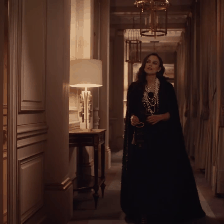

In [ ]:
to_gif(sample_video)

In [ ]:
def to_gif2(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation2.gif', converted_images, fps=30)
  return embed.embed_file('./animation2.gif')

In [ ]:
predict(sample_video)

Top 10 actions:
setting table                 : 48.43%
opening door                  : 10.45%
attending conference          :  4.80%
making the bed                :  4.36%
washing hands                 :  2.49%
cleaning toilet               :  1.59%
acting in play                :  1.47%
dancing charleston            :  1.25%
moving furniture              :  1.08%
dining                        :  1.02%



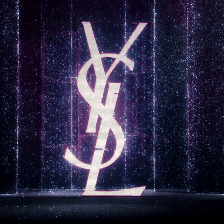

In [ ]:
to_gif2(sample_video_2)

In [ ]:
predict(sample_video_2)

Top 10 actions:
tagging graffiti              : 13.71%
hopscotch                     : 13.57%
hoverboarding                 :  6.79%
beatboxing                    :  5.50%
kitesurfing                   :  3.24%
news anchoring                :  2.62%
shooting goal (soccer)        :  2.35%
robot dancing                 :  2.24%
windsurfing                   :  2.22%
giving or receiving award     :  2.22%


# Predict Actions in Advertising Videos

In [ ]:
advertising_video_path = 'https://s3.ap-northeast-1.wasabisys.com/pubdatasets/videos/linterdit_rooney_mara.mp4'

In [ ]:
def to_gif_adverts(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./adverts_linterdit.gif', converted_images, fps=30)
  return embed.embed_file('./adverts_linterdit.gif')

In [ ]:
linterdit_sample_video = load_video(advertising_video_path)[:100]


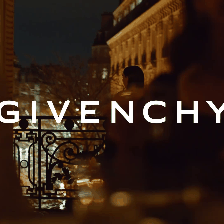

In [ ]:
to_gif_adverts(linterdit_sample_video)

In [ ]:
predict(linterdit_sample_video)

Top 10 actions:
brush painting                : 15.41%
tasting wine                  : 10.41%
playing gong                  :  6.37%
giving or receiving award     :  2.79%
smoking                       :  2.40%
setting table                 :  2.38%
playing saxophone             :  2.36%
putting on foundation         :  2.25%
cleaning windows              :  1.99%
kissing                       :  1.94%
